In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive/Compressed_New_Dataset

/content/drive/MyDrive/Compressed_New_Dataset


In [ ]:
# import efficientnet.keras as efn
import tensorflow as tf
from google.colab.patches import cv2_imshow
from collections import Counter
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras.layers import *
from tensorflow.keras import Model
import matplotlib.pyplot as plt
from tensorflow.keras.applications import * #Efficient Net included
from tensorflow.keras import models
import tensorflow.keras as K
import tensorflow
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.applications.resnet50 import ResNet50

In [ ]:
train_dir = "/content/drive/MyDrive/Compressed_New_Dataset/train_dir"
validation_dir = "/content/drive/MyDrive/Compressed_New_Dataset/validation_dir"
save_dir = "/content/drive/MyDrive/Compressed_New_Dataset/augmented_train"

In [ ]:
train_datagen = ImageDataGenerator(rescale = 1./255.,
                                   #rotation_range = 40,
                                   #fill_mode='constant',
                                   #width_shift_range = 0.2,
                                   #height_shift_range = 0.2,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True,
                                   vertical_flip = True)

test_datagen = ImageDataGenerator(rescale = 1.0/255.)

train_generator = train_datagen.flow_from_directory(train_dir, batch_size = 32, class_mode = 'binary', target_size = (224, 224))

# train_generator = train_datagen.flow_from_directory(train_dir, batch_size = 32, save_to_dir=save_dir ,save_prefix='N',save_format='jpeg',
#                                                     class_mode = 'binary', target_size = (224, 224))

validation_generator = test_datagen.flow_from_directory( validation_dir, batch_size = 32, class_mode = 'binary', target_size = (224, 224))

Found 472 images belonging to 2 classes.
Found 76 images belonging to 2 classes.


In [ ]:
# i = 0
# for batch in train_datagen.flow_from_directory(directory= train_dir,
#                                           batch_size=20,
#                                           target_size=(224, 224),
#                                           color_mode="rgb",
#                                           save_to_dir='augmented_train',
#                                           save_prefix='aug',
#                                           ):
#    i += 1
#    if i > 17:
#      break

In [ ]:
IMAGE_SIZE = [224,224]
resnet = ResNet50(input_shape=IMAGE_SIZE + [3], weights='imagenet',include_top=False)

In [ ]:
for layer in resnet.layers:    #layer.trainable=False means we dont want to retrain the existing weights.
    layer.trainable=False

model = K.models.Sequential()
model.add(resnet)
model.add(K.layers.Flatten())
model.add(K.layers.BatchNormalization())
model.add(K.layers.Dense(256, activation='relu'))
model.add(K.layers.BatchNormalization())
model.add(K.layers.Dense(128, activation='relu'))
model.add(K.layers.Dropout(0.3))
model.add(K.layers.BatchNormalization())
model.add(K.layers.Dense(64, activation='relu'))
model.add(K.layers.Dropout(0.3))
model.add(K.layers.BatchNormalization())
model.add(K.layers.Dense(1, activation='sigmoid'))



model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 flatten (Flatten)           (None, 100352)            0         
                                                                 
 batch_normalization (BatchN  (None, 100352)           401408    
 ormalization)                                                   
                                                                 
 dense (Dense)               (None, 256)               25690368  
                                                                 
 batch_normalization_1 (Batc  (None, 256)              1024      
 hNormalization)                                                 
                                                                 
 dense_1 (Dense)             (None, 128)               3

In [ ]:
opt = SGD(learning_rate=0.01, decay=1e-6, momentum=0.9, nesterov=True)

model.compile(
    loss="binary_crossentropy",
    optimizer= opt,
    metrics=["accuracy"],
)


earlystop = tensorflow.keras.callbacks.EarlyStopping(patience=10)
learning_rate_reduction = tensorflow.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy',
                                            patience=2,
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=0.00001)

checkpoint = tensorflow.keras.callbacks.ModelCheckpoint('./BTP_CV_resnet.h5', monitor='val_loss', verbose=1,
                             save_best_only=True, mode='min', save_weights_only = True)

mycallbacks = [earlystop, learning_rate_reduction,checkpoint]

counter = Counter(train_generator.classes)
max_val = float(max(counter.values()))
class_weights = {class_id : max_val/num_images for class_id, num_images in counter.items()}

#checkpointer = tensorflow.keras.callbacks.ModelCheckpoint(filepath='BTP_CV.h5',monitor="val_accuracy", verbose=1, save_best_only=True)

In [ ]:
epochs = 100
history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps= len(validation_generator),
    verbose=1,
    callbacks=mycallbacks,
    use_multiprocessing=True,
    shuffle = True,
    class_weight=class_weights
 )

Epoch 1/100
15/15 [==============================] - ETA: 0s - loss: 0.6964 - accuracy: 0.7521
Epoch 1: val_loss improved from inf to 4.53928, saving model to ./BTP_CV_resnet.h5
15/15 [==============================] - 146s 9s/step - loss: 0.6964 - accuracy: 0.7521 - val_loss: 4.5393 - val_accuracy: 0.5658 - lr: 0.0100
Epoch 2/100
15/15 [==============================] - ETA: 0s - loss: 0.6140 - accuracy: 0.7775
Epoch 2: val_loss improved from 4.53928 to 3.49589, saving model to ./BTP_CV_resnet.h5
15/15 [==============================] - 82s 6s/step - loss: 0.6140 - accuracy: 0.7775 - val_loss: 3.4959 - val_accuracy: 0.5526 - lr: 0.0100
Epoch 3/100
15/15 [==============================] - ETA: 0s - loss: 0.5391 - accuracy: 0.8199
Epoch 3: val_loss improved from 3.49589 to 1.47203, saving model to ./BTP_CV_resnet.h5
15/15 [==============================] - 106s 7s/step - loss: 0.5391 - accuracy: 0.8199 - val_loss: 1.4720 - val_accuracy: 0.5789 - lr: 0.0100
Epoch 4/100
15/15 [===========

In [ ]:
model.save("BTP_CV_Resnet.h5")

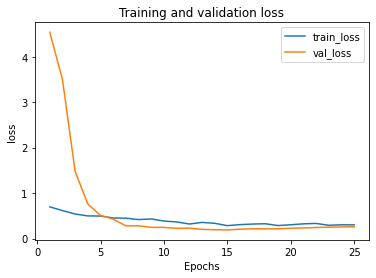

In [ ]:
metric = "loss"
train_metrics = history.history[metric]
val_metrics = history.history['val_'+metric]
epochs = range(1, len(train_metrics) + 1)
plt.plot(epochs, train_metrics)
plt.plot(epochs, val_metrics)
plt.title('Training and validation '+ metric)
plt.xlabel("Epochs")
plt.ylabel(metric)
plt.legend(["train_"+metric, 'val_'+metric])
plt.show()

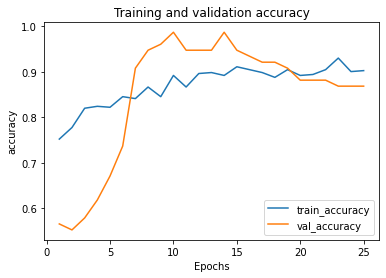

In [ ]:
metric = "accuracy"
train_metrics = history.history[metric]
val_metrics = history.history['val_'+metric]
epochs = range(1, len(train_metrics) + 1)
plt.plot(epochs, train_metrics)
plt.plot(epochs, val_metrics)
plt.title('Training and validation '+ metric)
plt.xlabel("Epochs")
plt.ylabel(metric)
plt.legend(["train_"+metric, 'val_'+metric])
plt.show()

In [ ]:
from tensorflow import keras
import numpy as np
model = keras.models.load_model('BTP_CV_Resnet.h5')

def test_image(image_path):
  img_height, img_width = 224, 224
  image = cv2.imread(image_path)
  cv2_imshow(image)

  # resize image
  dimensions = (img_height, img_width)
  image = cv2.resize(image, dimensions)
  cv2_imshow(image)

  # change color channels form bgr to rgb
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  # normalise data
  image = (image/255).astype(np.float16)
  image = image.reshape(1, image.shape[0], image.shape[1], image.shape[2])
  a = model.predict(image)
  if a<0.5:
    print("Cotton Plant")
  else:
    print("Non Cotton Plant")

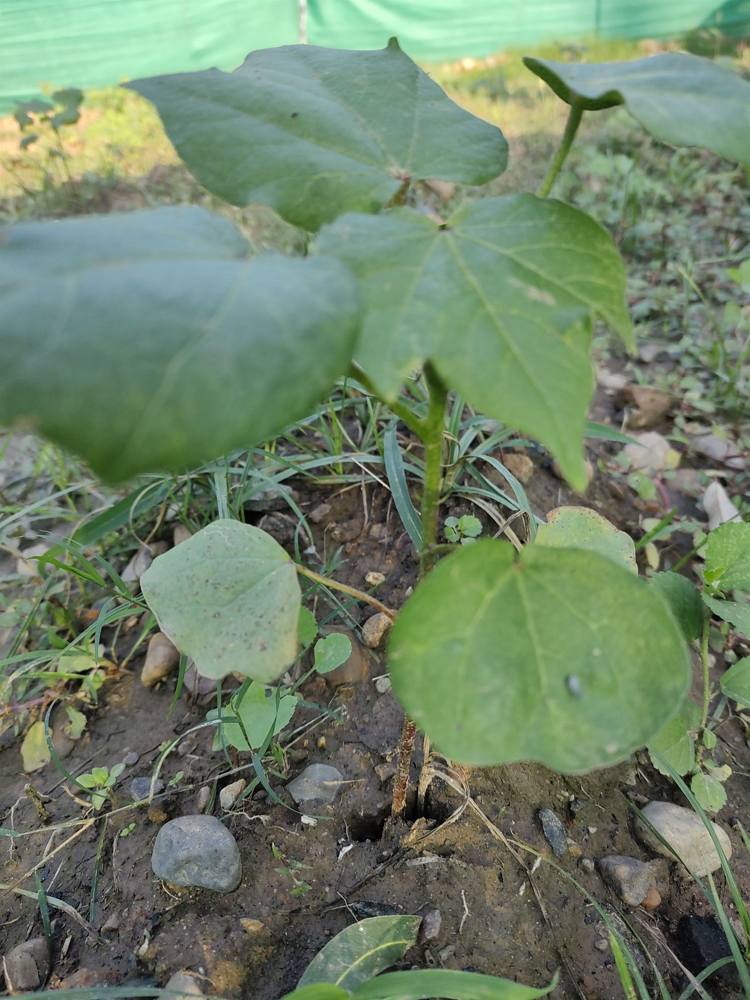

1/1 [==============================] - 0s 36ms/step
Non Cotton Plant


In [ ]:
# import required module
import os
# assign directory
directory = '/content/drive/MyDrive/Compressed_New_Dataset/validation_dir/Cotton'
path = []
# iterate over files in
# that directory
for filename in os.listdir(directory):
  # print(filename)
  f = os.path.join(directory, filename)
  path.append(str(f))
  # checking if it is a file
  # if os.path.isfile(f):
  #     print(f)

for i in range(len(path)):
  test_image(path[i])

#TESTED VIDEO

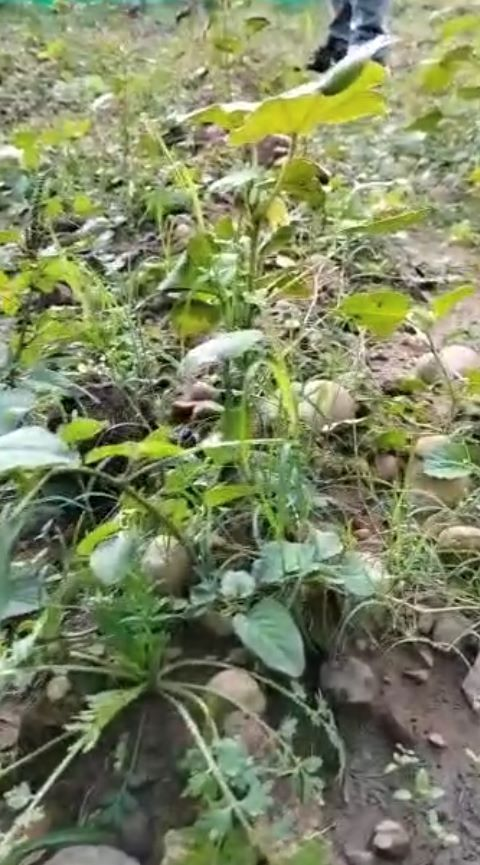

1/1 [==============================] - 0s 81ms/step
Non Cotton Plant


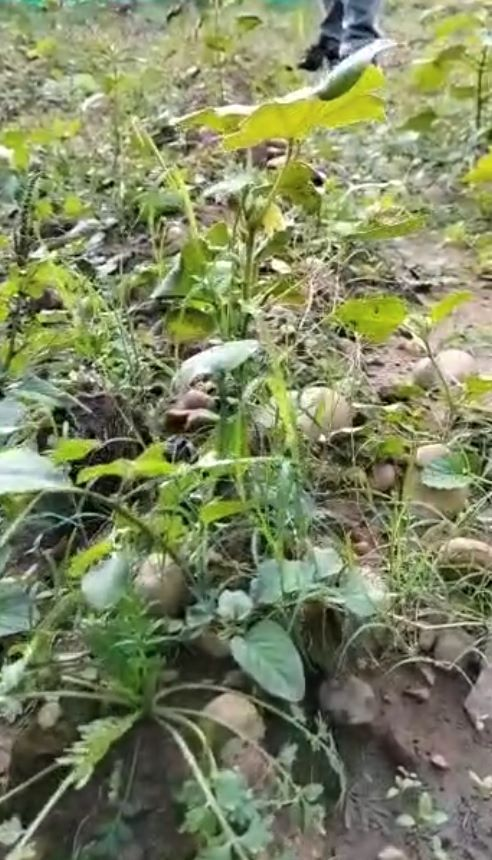

1/1 [==============================] - 0s 50ms/step
Non Cotton Plant


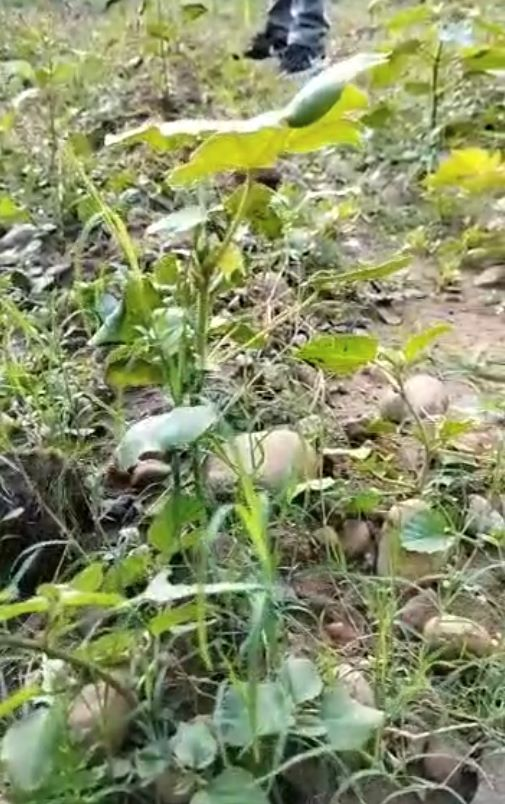

1/1 [==============================] - 0s 49ms/step
Non Cotton Plant


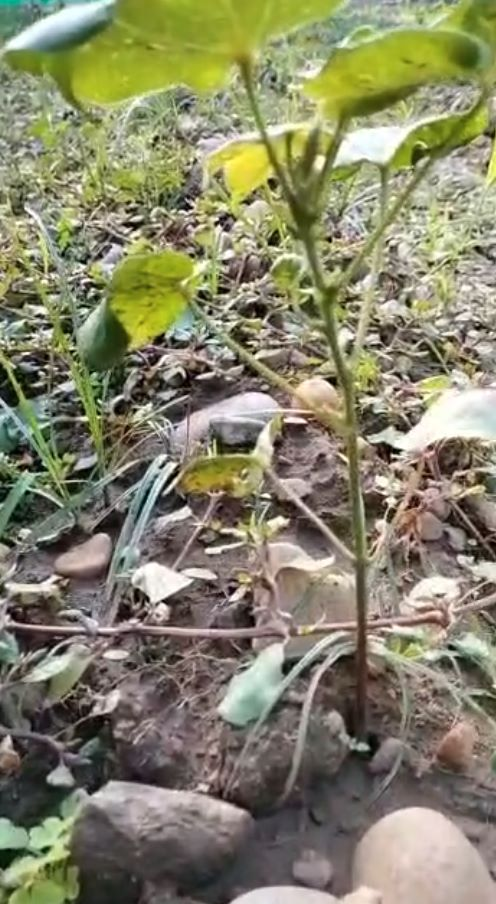

1/1 [==============================] - 0s 33ms/step
Non Cotton Plant


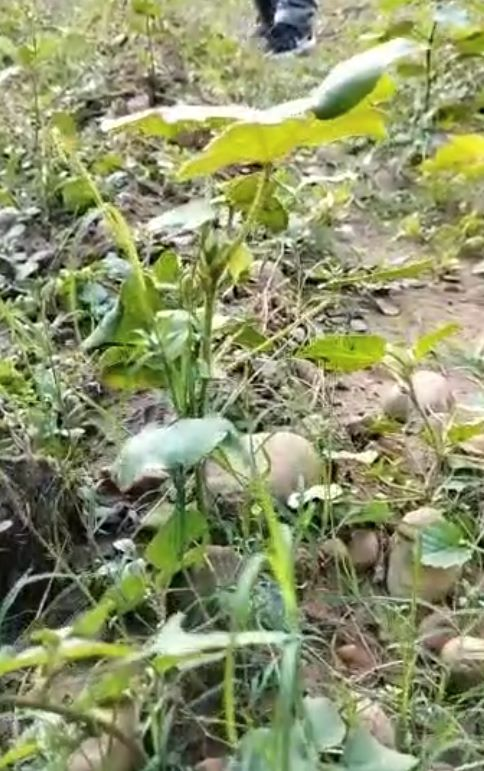

1/1 [==============================] - 0s 32ms/step
Non Cotton Plant


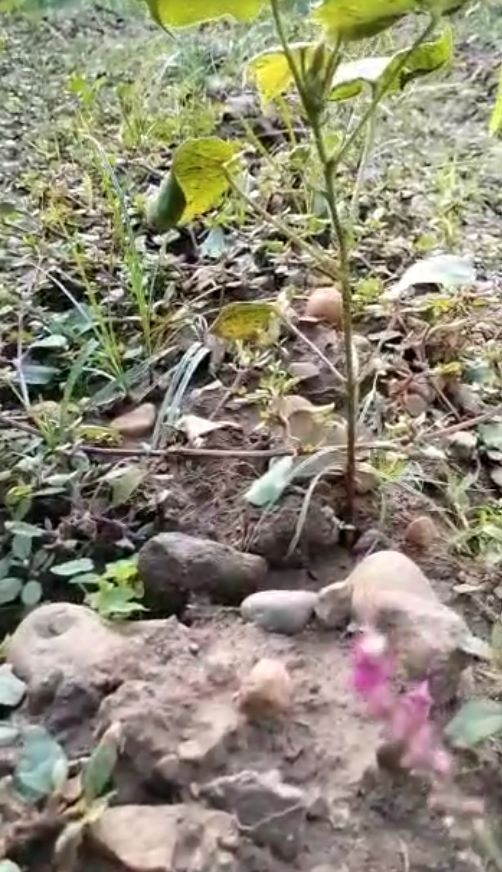

1/1 [==============================] - 0s 53ms/step
Non Cotton Plant


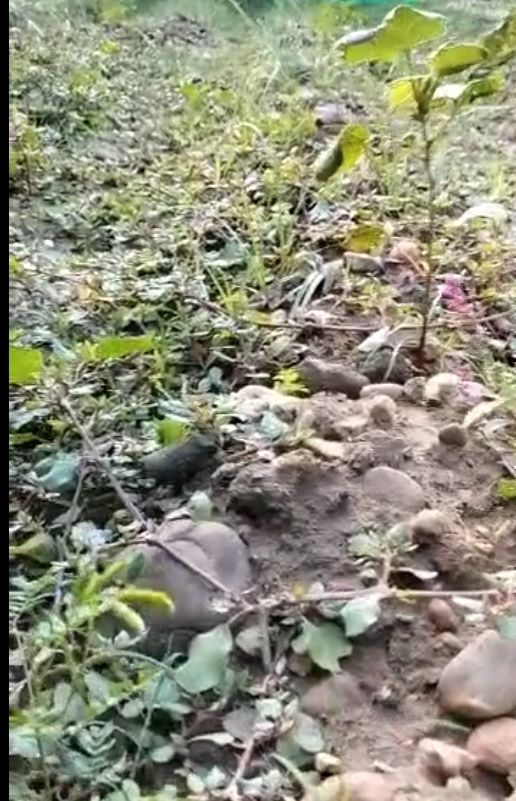

1/1 [==============================] - 0s 32ms/step
Non Cotton Plant


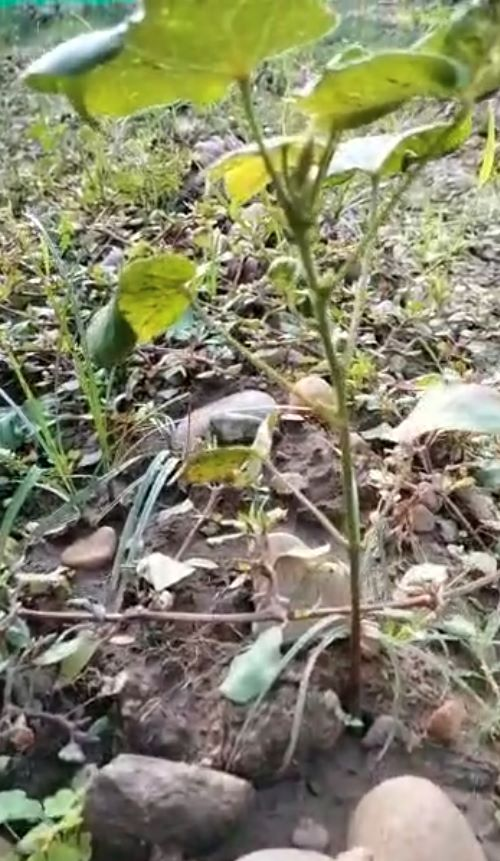

1/1 [==============================] - 0s 31ms/step
Non Cotton Plant


In [ ]:
# import required module
import os
# assign directory
directory = '/content/drive/MyDrive/Compressed_New_Dataset/test_video_images'
path = []
# iterate over files in
# that directory
for filename in os.listdir(directory):
  # print(filename)
  f = os.path.join(directory, filename)
  path.append(str(f))
  # checking if it is a file
  # if os.path.isfile(f):
  #     print(f)

for i in range(len(path)):
  test_image(path[i])

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
fig = plt.figure(figsize=(12, 12))
columns = 2
rows = 3
image_path_array = ["/content/drive/MyDrive/Compressed_New_Dataset/validation_dir/Cotton/IMG_20221014_132817.jpg",
                    "/content/drive/MyDrive/Compressed_New_Dataset/train_dir/Cotton/IMG20221014132608.jpg",
                    "/content/drive/MyDrive/Compressed_New_Dataset/train_dir/Cotton/IMG20221014132617.jpg",
                    "/content/drive/MyDrive/Compressed_New_Dataset/train_dir/Cotton/IMG20221014133232.jpg",
                    "/content/drive/MyDrive/Compressed_New_Dataset/train_dir/Cotton/IMG20221014133518.jpg",
                    "/content/drive/MyDrive/Compressed_New_Dataset/train_dir/Cotton/IMG_20221014_132723.jpg"]

for i in range(1, columns*rows +1):
    image = cv2.imread(image_path_array[i-1])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    fig.add_subplot(rows, columns, i)
    plt.imshow(image)
plt.show()

AttributeError: ignored

<Figure size 864x864 with 0 Axes>